This section is designed for a general analysis of the dataset that is output from **TripleA** and is in the form of a Json file.

**Version** : *0.0.2*

# Prepare Dataset

In [13]:
# from src.step05_calculate import BibliometricCalculator, read_repository
import pandas as pd
from src.config import OUTPUT_DIR, DATA_DIR
import matplotlib.pyplot as plt
import numpy as np
import json

## Define Variable

In [14]:
OUTPUT_DIR = OUTPUT_DIR / "new"
ds_path = DATA_DIR / "dataset-mie.json"

## Read Dataset

In [15]:
with open(ds_path, "r") as json_file:
    data = json.load(json_file)

# data = read_repository(ds_path)
df = pd.DataFrame(data)

# df.info()

## SCIMago Data Enrichment
The SCImago Journal & Country Rank is a publicly available portal that includes the journals and country scientific indicators developed from the information contained in the Scopus® database (Elsevier B.V.).

### New Approche
In this process we get information from [Scimago Journal & Country Rank](https://www.scimagojr.com/index.php) and clean this data then join with article dataset.

In [11]:
def normalized_issn(issn):
    """
    Normalizes the ISSN field by splitting it on the comma and returning a list of ISSNs.
    """
    issn_list = []
    if issn.__contains__(','):
        pass
        l = issn.split(',')
        for i in l:
            i= i.strip()
            if len(i) == 8 :
                i = i[:4] + '-' + i[-4:]
                issn_list.append(i)
            else:
                print(i)
    else:
        issn = issn.strip()
        issn = issn[:4] + '-' + issn[-4:]
        issn_list.append(issn)
    return issn_list

In [12]:
scimago_df = pd.read_csv(DATA_DIR / 'scimagojr 2023.csv',
                          delimiter=";",
                        #   encoding='latin-1',
                          # encoding='utf-8'
                          )

scimago_df['normal_issn'] = scimago_df['Issn'].apply(normalized_issn)

# Explode the DataFrame to create new rows for each ISSN
final_scimago_df = scimago_df.explode('normal_issn')

# This file use for qlickview
final_scimago_df.to_csv(DATA_DIR / 'scimagojr 2023_normal_issn.csv',)

final_scimago_df = final_scimago_df.drop(columns=["H index", "Sourceid" ,"Type", "Issn",
                                      "SJR",
                                      "Total Docs. (2023)",
                                      "Total Docs. (3years)",
                                      "Total Refs.",
                                      "Total Cites (3years)",
                                      "Citable Docs. (3years)",
                                      "Cites / Doc. (2years)",
                                      "Ref. / Doc.",
                                      "%Female",
                                      "Overton",
                                      "SDG",
                                      "Coverage",
                                      "Categories",
                                      "Areas"  
                                      ]
                                      )

new_df = final_scimago_df.groupby(list(final_scimago_df.columns)).size().reset_index(name='Document_Count')
new_df = new_df.rename(columns={'Rank': 'journal_rank'})
new_df = new_df.rename(columns={'Title': 'journal_title'})
new_df = new_df.rename(columns={'SJR Best Quartile': 'journal_q'})
new_df = new_df.rename(columns={'Country': 'journal_country'})
new_df = new_df.rename(columns={'Region': 'journal_region'})
new_df = new_df.rename(columns={'Publisher': 'journal_publisher'})
new_df = new_df.drop(columns=[ "Document_Count"])


df = pd.merge(df, new_df, left_on='journal_issn', right_on='normal_issn', how='left')

df.info()

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\BT\\Desktop\\CodeBase\\github\\ai-powered-affiliation-extraction\\data\\scimagojr 2023.csv'

# General Info

In [ ]:
import pandas as pd

# Fill missing or invalid values in citation_count with 0
df['citation_count'] = pd.to_numeric(df['citation_count'], errors='coerce').fillna(0)

# Calculate Total Citations and Average Citations
total_citations = df['citation_count'].sum()
average_citations = df['citation_count'].mean()

# Assuming df is your original DataFrame from the JSON data
general_data = {
    'Index': [
        'Total Publications',
        'Total Countries',
        # 'Total Institutes',
        # 'Total Journals',
        'Total Authors',
        'Total Citations',
        'Average Citations'
    ],
    'Value': [
        len(df),
        df['affiliation_countries'].explode().nunique(),
        # df['affiliation_integration_institution'].explode().nunique(),
        # df['journal_iso_abbreviation'].nunique(),
        df['authors'].explode().nunique(),
        total_citations,
        round(average_citations)
    ]
}

general_df = pd.DataFrame(general_data)
general_df.to_csv(OUTPUT_DIR / "General-Info.csv")
general_df.head(20)

,Index,Value
0,Total Publications,4606
1,Total Countries,54
2,Total Citations,6191
3,Average Citations,1


# Publication and citation trend

## The top 10 most cited works of literature

top_most_cited_article.csv as complete list Saved.


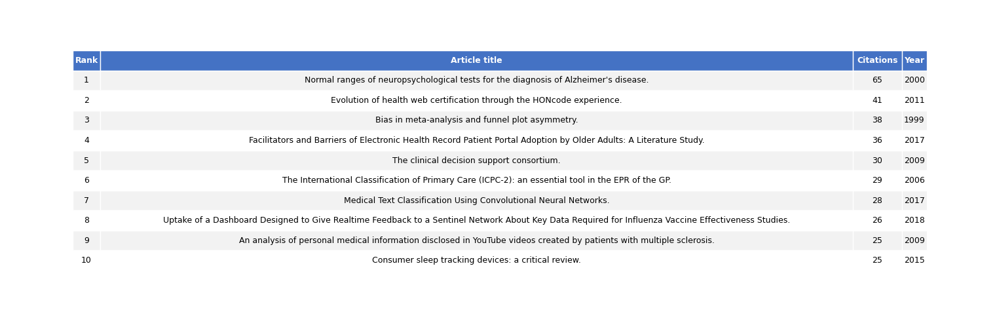

In [23]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your DataFrame
top_most_cited_df = df.sort_values('citation_count', ascending=False).reset_index(drop=True)
top_most_cited_df['Rank'] = top_most_cited_df.index + 1

top_most_cited_df.to_csv(OUTPUT_DIR / "country_co_occurrence_matrix.csv")
print("top_most_cited_article.csv as complete list Saved.")

top_most_cited_df = top_most_cited_df.head(10)

data = top_most_cited_df[['Rank', 'title', 'citation_count',  'year']]
data.columns = ['Rank', 'Article title', 'Citations',  'Year']

fig, ax = plt.subplots(figsize=(16, 5))
ax.axis('off')

table = ax.table(cellText=data.values,
                 colLabels=data.columns,
                 cellLoc='center',
                 loc='center')

table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1, 1.5)

for k, cell in table._cells.items():
    cell.set_edgecolor('w')
    if k[0] == 0:
        cell.set_facecolor('#4472C4')
        cell.set_text_props(weight='bold', color='w')
    elif k[0] % 2 == 1:
        cell.set_facecolor('#F2F2F2')
    else:
        cell.set_facecolor('w')

table.auto_set_column_width(col=list(range(len(data.columns))))

plt.tight_layout()
plt.savefig(OUTPUT_DIR  / "Top_most_cited_article.png")
plt.show()


## Annual and Cumulative Publication Trends

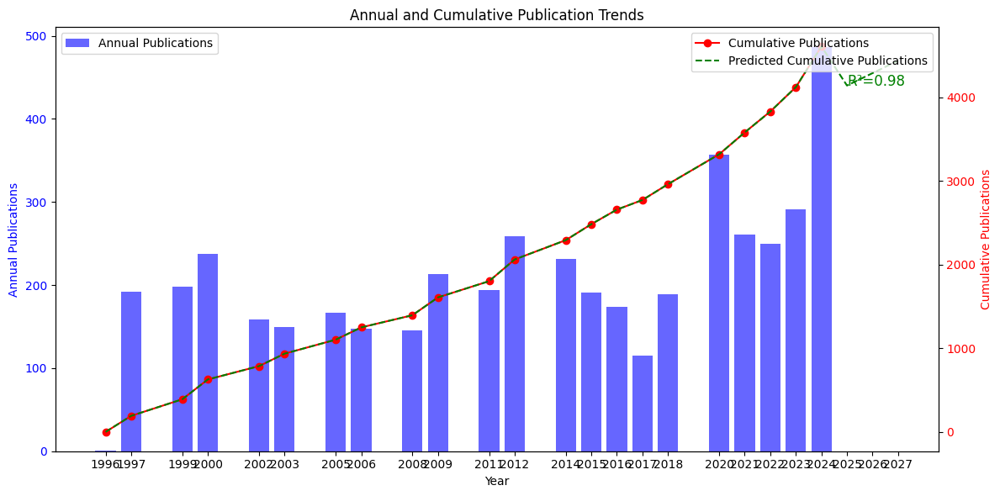

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Assuming df is already loaded
# Convert year to integer
df['year-int'] = df['year'].astype(int)

# Step 1: Calculate annual and cumulative publication counts
annual_counts = df.groupby("year-int").size().reset_index(name="annual_count")
annual_counts["cumulative_count"] = annual_counts["annual_count"].cumsum()

# Step 2: Prepare data for linear regression
X = annual_counts["year-int"].values.reshape(-1, 1)
y = annual_counts["cumulative_count"].values

# Step 3: Fit linear regression model
model = LinearRegression()
model.fit(X, y)
r2 = r2_score(y, model.predict(X))

# Step 4: Predict cumulative publications for the next three years
last_year = annual_counts["year-int"].max()
future_years = np.arange(last_year + 1, last_year + 4).reshape(-1, 1)
future_predictions = model.predict(future_years)

# Step 5: Combine future predictions with existing data for visualization
predicted_years = np.concatenate((X.flatten(), future_years.flatten()))
predicted_cumulative = np.concatenate((y, future_predictions))

# Step 6: Create the dual-axis chart
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot annual counts as a bar chart
ax1.bar(annual_counts["year-int"], annual_counts["annual_count"], color='blue', alpha=0.6, label="Annual Publications")
ax1.set_xlabel("Year")
ax1.set_ylabel("Annual Publications", color="blue")
ax1.tick_params(axis="y", labelcolor="blue")

# Plot cumulative counts as a line chart
ax2 = ax1.twinx()
ax2.plot(annual_counts["year-int"], annual_counts["cumulative_count"], color="red", marker='o', label="Cumulative Publications")
ax2.plot(predicted_years, predicted_cumulative, color="green", linestyle="dashed", label="Predicted Cumulative Publications")
ax2.set_ylabel("Cumulative Publications", color="red")
ax2.tick_params(axis="y", labelcolor="red")

# Add annotations and labels
plt.title("Annual and Cumulative Publication Trends")
all_years = np.sort(np.unique(np.concatenate((annual_counts["year-int"], future_years.flatten()))))
plt.xticks(all_years, rotation=45, ha='right')

ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.text(future_years[0][0], future_predictions[0], f"R²={r2:.2f}", color="green", fontsize=12)

# Display the chart
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "Annual-and-Cumulative-Publication-Trends.png")
plt.show()


## Annual and Cumulative Citation Trends

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

# Convert to DataFrame
df = pd.DataFrame(data)

# Ensure the 'year' column is numeric
df['year-int'] = pd.to_numeric(df['year'], errors='coerce')

# Ensure 'citation_count' column is numeric
df['citation_count'] = pd.to_numeric(df['citation_count'], errors='coerce')

# Drop rows with invalid year or citation_count values
df = df.dropna(subset=['year-int', 'citation_count'])

# Calculate annual citation counts
annual_citations = df.groupby('year-int')['citation_count'].sum().sort_index()
annual_citations = annual_citations.rename_axis('year-int').reset_index(name='Total Citations')

# Calculate cumulative annual growth for citations
annual_citations['Cumulative Citations'] = annual_citations['Total Citations'].cumsum()

# Prepare for prediction
X = annual_citations[['year-int']].values
y = annual_citations['Cumulative Citations'].values

# Fit a linear regression model
model = LinearRegression()
model.fit(X, y)

# Predict cumulative citations for the next three years
future_years = np.arange(annual_citations['year-int'].max() + 1, annual_citations['year-int'].max() + 4).reshape(-1, 1)
future_predictions = model.predict(future_years)

# Calculate R2 score
r2_score = model.score(X, y)

# Plot the data
fig, ax1 = plt.subplots(figsize=(12, 8))

# Plot annual citation totals (left axis)
ax1.bar(annual_citations['year-int'], annual_citations['Total Citations'], label='Annual Citations', alpha=0.7, color='blue')
ax1.set_xlabel('Year')
ax1.set_ylabel('Annual Citations', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Plot cumulative citations (right axis)
ax2 = ax1.twinx()
ax2.plot(annual_citations['year-int'], annual_citations['Cumulative Citations'], label='Cumulative Citations', color='red', marker='o')
future_years_flat = future_years.flatten()
future_cumulative_years = np.concatenate((annual_citations['year-int'], future_years_flat))
future_cumulative_values = np.concatenate((annual_citations['Cumulative Citations'], future_predictions))
ax2.plot(future_cumulative_years, future_cumulative_values, linestyle='--', color='green', label='Predicted Cumulative Growth')
ax2.set_ylabel('Cumulative Citations', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Annotate R2 score
ax2.text(annual_citations['year-int'].min() + 1, max(annual_citations['Cumulative Citations']), f"R2 = {r2_score:.2f}", fontsize=12, color='green')

# Format the plot
fig.suptitle('Annual and Cumulative Citation Trends')


#=====
# Generate a list of all years, including those without data
all_years = range(annual_counts["year-int"].min(), int(future_years[-1][0]) + 1)

# Set x-ticks for all years and rotate labels diagonally
plt.xticks(all_years, rotation=45, ha='right')

# Rotate X-axis labels diagonally
for label in ax1.get_xticklabels():
    label.set_rotation(45)
    label.set_ha('right')

# Adjust legend positions
ax1.legend(loc="upper left")
ax2.legend(loc="center left", bbox_to_anchor=(0, 0.5))
#====


# ax1.legend(loc='upper left')
# ax2.legend(loc='upper right')
fig.tight_layout()

# Show the plot
plt.savefig(OUTPUT_DIR  / "Annual-and-Cumulative-Citation-Trends.png")
plt.show()


NameError: name 'data' is not defined

## Percentage of Annual Publications by Top 10 Countries

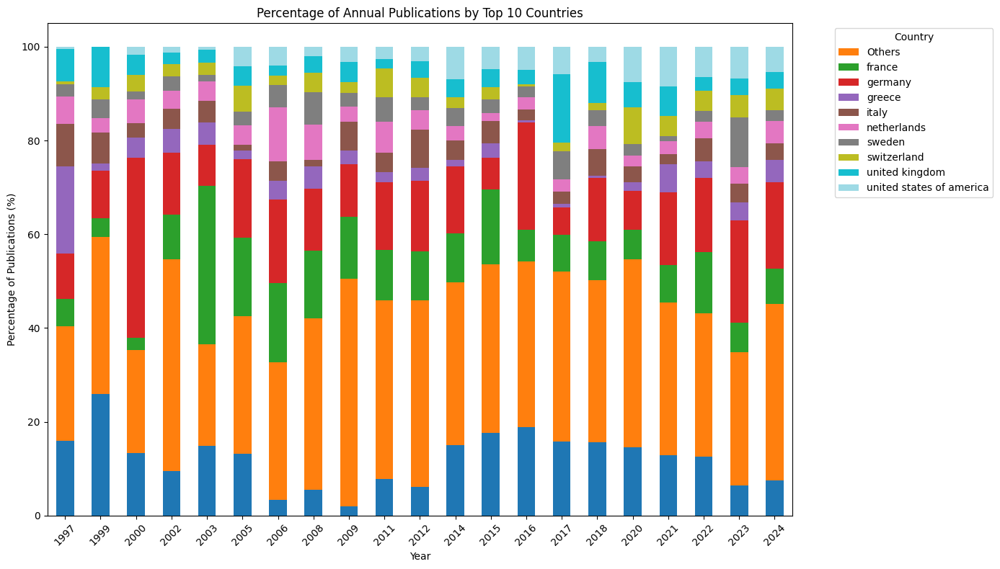

In [34]:
import pandas as pd
import matplotlib.pyplot as plt


# Ensure the 'year' and 'affiliation_integration_country' fields exist
df['year-int'] = pd.to_numeric(df['year'], errors='coerce')
df = df.explode('affiliation_countries')  # Handle multiple affiliations per publication

# Drop rows with missing values
df = df.dropna(subset=['year-int', 'affiliation_countries'])

# Calculate annual publication counts by country
annual_country_counts = df.groupby(['year-int', 'affiliation_countries']).size().reset_index(name='count')

# Calculate the total publications per year
annual_totals = annual_country_counts.groupby('year-int')['count'].sum().reset_index(name='total')

# Merge total annual counts back into the country-level data
annual_country_counts = annual_country_counts.merge(annual_totals, on='year-int')

# Calculate the percentage of publications for each country
annual_country_counts['percentage'] = (annual_country_counts['count'] / annual_country_counts['total']) * 100

# Identify the top 10 countries by total publications across all years
top_countries = annual_country_counts.groupby('affiliation_countries')['count'].sum().nlargest(10).index

# Mark countries not in the top 10 as "Others"
annual_country_counts['country_grouped'] = annual_country_counts['affiliation_countries'].where(
    annual_country_counts['affiliation_countries'].isin(top_countries), 'Others'
)

# Recalculate percentages for grouped countries
annual_grouped = annual_country_counts.groupby(['year-int', 'country_grouped'])['count'].sum().reset_index()
annual_totals = annual_grouped.groupby('year-int')['count'].sum().reset_index(name='total')
annual_grouped = annual_grouped.merge(annual_totals, on='year-int')
annual_grouped['percentage'] = (annual_grouped['count'] / annual_grouped['total']) * 100

# Pivot data for plotting
plot_data = annual_grouped.pivot(index='year-int', columns='country_grouped', values='percentage').fillna(0)

# Plot the data
plot_data.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='tab20')

# Format the plot
plt.title('Percentage of Annual Publications by Top 10 Countries')
plt.xlabel('Year')
plt.ylabel('Percentage of Publications (%)')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.savefig(OUTPUT_DIR  / "Percentage-of-Annual-Publications-by-Top-10-Countries-Stacked-Column.png")
plt.show()


## Bubble chart to visualize the top 10 countries

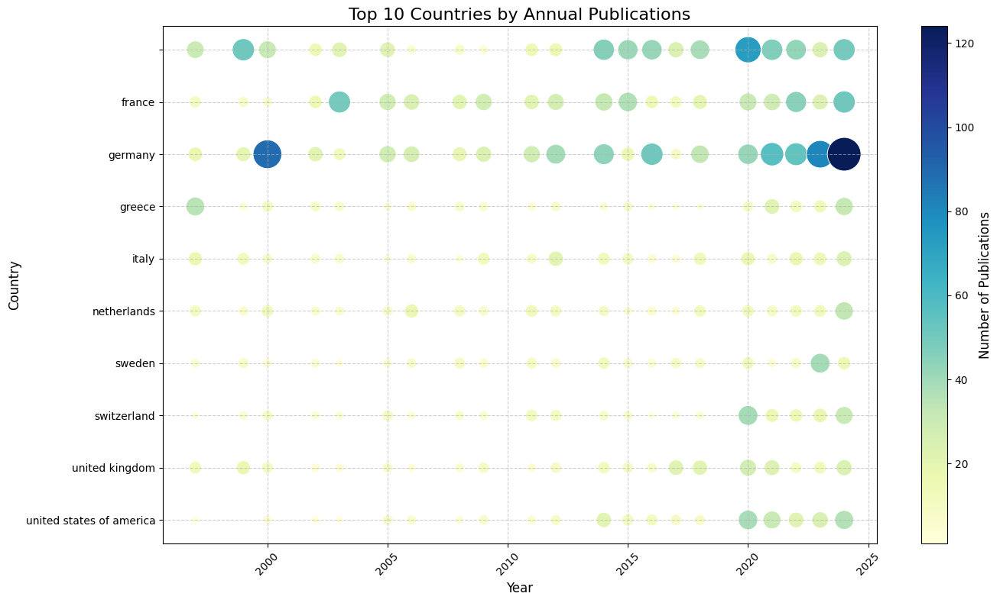

Top-Annual-Publications-by-Top-10-Countries-Bubble.png saved.


In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Convert to DataFrame
df = pd.DataFrame(data)

# Ensure the 'year' and 'affiliation_integration_country' fields exist
df['year-int'] = pd.to_numeric(df['year'], errors='coerce')
df = df.explode('affiliation_countries')  # Handle multiple affiliations per publication

# Drop rows with missing values
df = df.dropna(subset=['year-int', 'affiliation_countries'])

# Calculate annual publication counts by country
annual_country_counts = df.groupby(['year-int', 'affiliation_countries']).size().reset_index(name='count')

# Identify the top 10 countries by total publications across all years
top_countries = (
    annual_country_counts.groupby('affiliation_countries')['count']
    .sum()
    .nlargest(10)
    .index
)

# Filter data to include only the top 10 countries
filtered_data = annual_country_counts[annual_country_counts['affiliation_countries'].isin(top_countries)]

# Create the bubble chart
plt.figure(figsize=(14, 8))

# Normalize the color map
norm = mcolors.Normalize(vmin=filtered_data['count'].min(), vmax=filtered_data['count'].max())
cmap = cm.ScalarMappable(norm=norm, cmap='YlGnBu')
cmap.set_array([])

bubble = sns.scatterplot(
    data=filtered_data,
    x='year-int',
    y='affiliation_countries',
    size='count',
    sizes=(50, 1000),
    hue='count',
    palette='YlGnBu',
    legend=None
)

# Add a color bar
cbar = plt.colorbar(cmap, ax=bubble.axes)
cbar.set_label('Number of Publications', fontsize=12)

# Format the plot
plt.title('Top 10 Countries by Annual Publications', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()

# Show the plot
plt.savefig(OUTPUT_DIR  / "Top-Annual-Publications-by-Top-10-Countries-Bubble.png")
plt.show()
print("Top-Annual-Publications-by-Top-10-Countries-Bubble.png saved.")


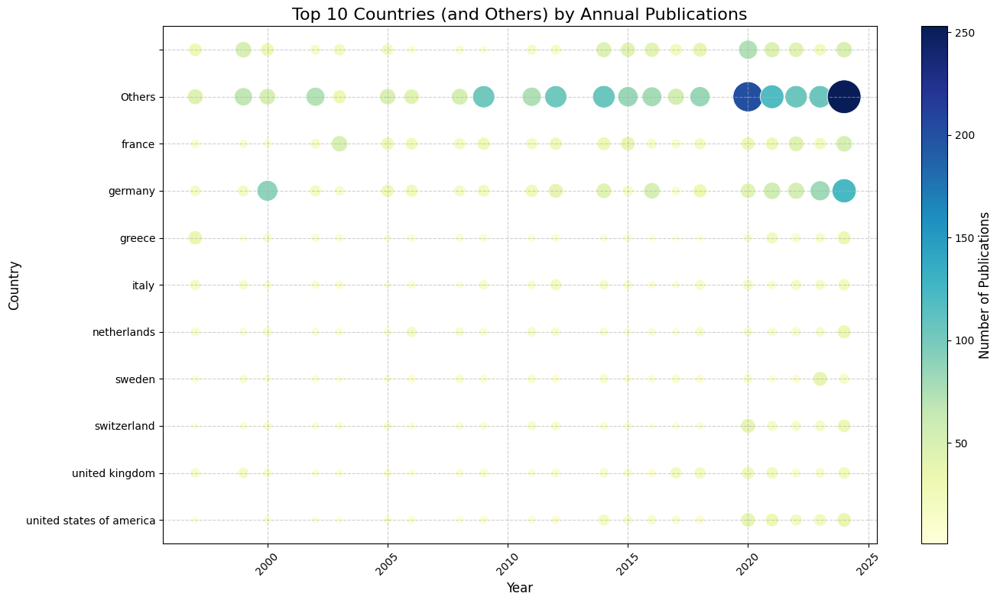

Top-10-Countries-(and Others)-by-Annual-Publications-Bubble.png


In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as mcolors


# Convert to DataFrame
df = pd.DataFrame(data)

# Ensure the 'year' and 'affiliation_integration_country' fields exist
df['year-int'] = pd.to_numeric(df['year'], errors='coerce')
df = df.explode('affiliation_countries')  # Handle multiple affiliations per publication

# Drop rows with missing values
df = df.dropna(subset=['year-int', 'affiliation_countries'])

# Calculate annual publication counts by country
annual_country_counts = df.groupby(['year-int', 'affiliation_countries']).size().reset_index(name='count')

# Identify the top 10 countries by total publications across all years
top_countries = (
    annual_country_counts.groupby('affiliation_countries')['count']
    .sum()
    .nlargest(10)
    .index
)

# Group other countries as "Others"
annual_country_counts['country_grouped'] = annual_country_counts['affiliation_countries'].where(
    annual_country_counts['affiliation_countries'].isin(top_countries), 'Others'
)

# Recalculate counts for grouped data
grouped_data = annual_country_counts.groupby(['year-int', 'country_grouped'])['count'].sum().reset_index()

# Create the bubble chart
plt.figure(figsize=(14, 8))

# Normalize the color map
norm = mcolors.Normalize(vmin=grouped_data['count'].min(), vmax=grouped_data['count'].max())
cmap = cm.ScalarMappable(norm=norm, cmap='YlGnBu')
cmap.set_array([])

bubble = sns.scatterplot(
    data=grouped_data,
    x='year-int',
    y='country_grouped',
    size='count',
    sizes=(50, 1000),
    hue='count',
    palette='YlGnBu',
    legend=None
)

# Add a color bar
cbar = plt.colorbar(cmap, ax=bubble.axes)
cbar.set_label('Number of Publications', fontsize=12)

# Format the plot
plt.title('Top 10 Countries (and Others) by Annual Publications', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()

# Show the plot
plt.savefig(OUTPUT_DIR  / "Top-10-Countries-(and Others)-by-Annual-Publications-Bubble.png")
plt.show()
print("Top-10-Countries-(and Others)-by-Annual-Publications-Bubble.png")


# Publication Type

## Distribution of Publication Types

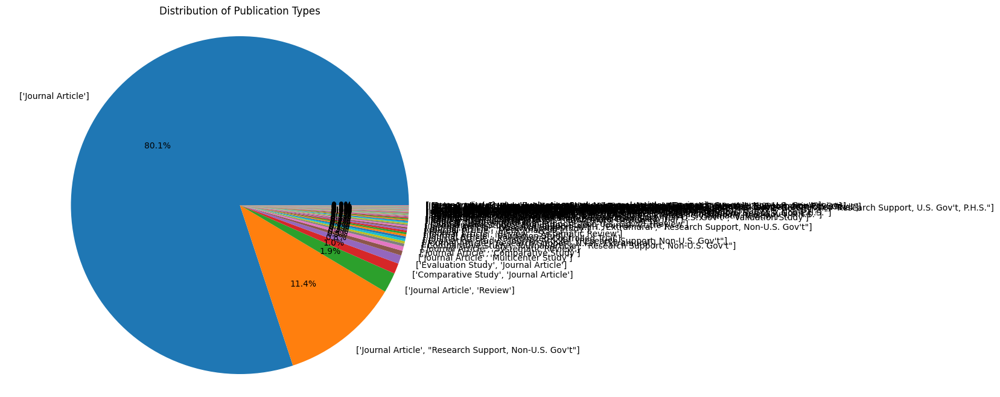

Distribution-of-Publication-Types.png Saved.


In [38]:
import matplotlib.pyplot as plt

# Count the occurrences of each publication type
publication_counts = df['publication_type'].value_counts()

# Create a pie chart
plt.figure(figsize=(10, 8))
plt.pie(publication_counts.values, labels=publication_counts.index, autopct='%1.1f%%')
plt.title('Distribution of Publication Types')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

plt.savefig(OUTPUT_DIR  / "Distribution-of-Publication-Types.png")
plt.show()
print("Distribution-of-Publication-Types.png Saved.")


## Publication Types by Year

In [39]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your DataFrame
# Group the data by year and publication_type, and count the occurrences
grouped_data = df.groupby(['year', 'publication_type']).size().unstack(fill_value=0)

# Create the stacked bar chart
ax = grouped_data.plot(kind='bar', stacked=True, figsize=(12, 6))

# Customize the chart
plt.title('Publication Types by Year')
plt.xlabel('Year')
plt.ylabel('Number of Publications')
plt.legend(title='Publication Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Add value labels on the bars
for c in ax.containers:
    ax.bar_label(c, label_type='center')

plt.savefig(OUTPUT_DIR  / "Publication-Types-by-Year.png")
plt.show()
print("Publication-Types-by-Year.png Saved.")


TypeError: unhashable type: 'list'

# Country

## Top 10 Countries by Publication - Table

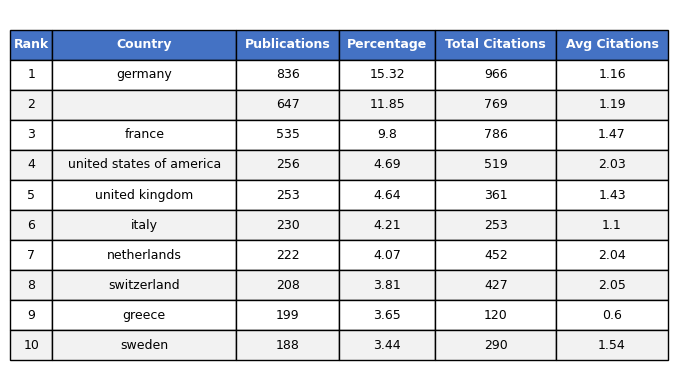

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

### USE df ###

# Step 1: Explode the country list column
df_exploded = df.explode('affiliation_countries')

# Step 2: Calculate country-wise statistics
country_stats = df_exploded.groupby('affiliation_countries').agg({
    'title': 'count',
    'citation_count': 'sum'
}).reset_index()

country_stats = country_stats.rename(columns={
    'title': 'Publications',
    'citation_count': 'Total Citations'
})

# Step 3: Calculate percentages and average citations
total_publications = country_stats['Publications'].sum()
country_stats['Percentage'] = (country_stats['Publications'] / total_publications * 100)
country_stats['Avg Citations'] = country_stats['Total Citations'] / country_stats['Publications']

# Step 4: Select top 10 countries and add rank
# Before Save in csv
country_stats.to_csv(OUTPUT_DIR / "Top-10-Countries-by-Publication.csv")

country_stats = country_stats.sort_values('Publications', ascending=False).head(10).reset_index(drop=True)
country_stats['Rank'] = country_stats.index + 1

# Step 5: Reorder columns
country_stats = country_stats[['Rank', 'affiliation_countries', 'Publications', 'Percentage', 'Total Citations', 'Avg Citations']]
country_stats = country_stats.rename(columns={'affiliation_countries': 'Country'})

# Step 6: Ensure numeric columns are of the correct data type
numeric_columns = ['Publications', 'Percentage', 'Total Citations', 'Avg Citations']
for col in numeric_columns:
    country_stats[col] = pd.to_numeric(country_stats[col], errors='coerce')

# Step 7: Round numeric values
country_stats[numeric_columns] = country_stats[numeric_columns].round(2)

# Step 8: Create the plot
fig, ax = plt.subplots(figsize=(5, 4))
ax.axis('off')

# Step 9: Create the table
table = ax.table(cellText=country_stats.values,
                 colLabels=country_stats.columns,
                 loc='center',
                 cellLoc='center')

# Step 10: Format the table
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1, 1.5)


# Step 11: Add zebra striping

# Style the header
for j, cell in enumerate(table._cells[(0, j)] for j in range(len(country_stats.columns))):
    cell.set_facecolor('#4472C4')
    cell.set_text_props(color='white', weight='bold')


for i in range(1, len(country_stats) + 1):
    for j in range(len(country_stats.columns)):
        cell = table._cells[(i, j)]
        if i % 2 == 0:
            cell.set_facecolor('#F2F2F2')
        else:
            cell.set_facecolor('white')


# Step 12: Adjust column widths
table.auto_set_column_width(col=list(range(len(country_stats.columns))))

# Step 13: Display the plot
plt.tight_layout()
plt.savefig(OUTPUT_DIR  / "Top-10-Countries-by-Publication.png")
plt.show()


## Top 10 Countries by Citation Impact in Scientific Research - Bar Chart

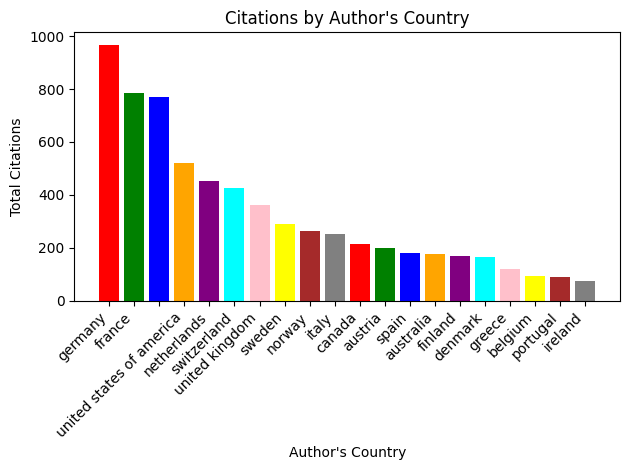

In [43]:
top = 20
# Calculate country-wise statistics
country_stats = df_exploded.groupby('affiliation_countries').agg({
    'citation_count': 'sum'
}).reset_index()

country_stats = country_stats.rename(columns={
    'affiliation_countries': 'Country',
    'citation_count': 'Total Citations'
})

country_stats = country_stats.sort_values('Total Citations', ascending=False).head(top).reset_index(drop=True)


# Define a list of colors for each bar
colors = ['red', 'green', 'blue', 'orange', 'purple', 'cyan', 'pink', 'yellow', 'brown', 'gray'] * 3


plt.bar(country_stats['Country'], country_stats['Total Citations'], color=colors[:len(country_stats)])
plt.xlabel("Author's Country")
plt.ylabel('Total Citations')
plt.title("Citations by Author's Country")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(OUTPUT_DIR  / "Top-10-Countries-by-Citation-Impact-in-Scientific-Research.png")
plt.show()


## Global Publication Distribution and Collaboration Network - Map3

In [5]:
import pandas as pd
import plotly.graph_objects as go
from itertools import combinations
import plotly.io as pio

def create_publication_map(df):
    # Get country counts
    country_counts = {}
    for countries in df['affiliation_countries']:
        for country in countries:
            country_counts[country] = country_counts.get(country, 0) + 1
    
    # Create connections between collaborating countries
    connections = []
    for countries in df['affiliation_countries']:
        for c1, c2 in combinations(sorted(countries), 2):
            connections.append((c1, c2))
    
    # Count frequency of connections
    connection_counts = {}
    for conn in connections:
        connection_counts[conn] = connection_counts.get(conn, 0) + 1
    
    # Dictionary for converting country names to ISO codes (expand as needed)
    country_to_iso = {
        'usa': 'USA',
        'canada': 'CAN',
        'germany': 'DEU',
        'iran': 'IRN',
        'china': 'CHN',
        'australia': 'AUS',
        'spain': 'ESP',
        'italy': 'ITA',
        'thailand': 'THA',
        'sweden': 'SWE',
        'united kingdom': 'GBR'
    }
    
    # Convert country counts to ISO codes
    iso_counts = {country_to_iso.get(k, k): v for k, v in country_counts.items() if k in country_to_iso}
    
    # Dictionary of country coordinates for connection lines
    coords = {
        'usa': (40.7128, -74.0060),
        'canada': (56.1304, -106.3468),
        'germany': (51.1657, 10.4515),
        'iran': (32.4279, 53.6880),
        'china': (35.8617, 104.1954),
        'australia': (-25.2744, 133.7751),
        'spain': (40.4637, -3.7492),
        'italy': (41.8719, 12.5674),
        'thailand': (15.8700, 100.9925),
        'sweden': (60.1282, 18.6435),
        'united kingdom': (55.3781, -3.4360)
    }
    
    # Create the figure
    fig = go.Figure()
    
    # Add choropleth map
    fig.add_trace(go.Choropleth(
        locations=list(iso_counts.keys()),
        z=list(iso_counts.values()),
        text=[f"{k}: {v} publications" for k, v in iso_counts.items()],
        colorscale='Blues',
        colorbar_title='Number of Publications',
        name='',
        hovertemplate='%{text}<extra></extra>',
        showscale=True,
        colorbar=dict(
            thickness=15,
            len=0.5,
            x=0.9,
            y=0.5,
            title=dict(text='Number of Publications')
        )
    ))
    
    # Get min and max connection values for normalization
    min_connections = min(connection_counts.values())
    max_connections = max(connection_counts.values())
    
    # Function to get line width based on connection weight
    def get_line_width(weight):
        return 1 + ((weight - min_connections) / (max_connections - min_connections)) * 4
    
    # Add connection lines
    for (c1, c2), weight in connection_counts.items():
        if c1 in coords and c2 in coords:
            fig.add_trace(go.Scattergeo(
                lon=[coords[c1][1], coords[c2][1]],
                lat=[coords[c1][0], coords[c2][0]],
                mode='lines',
                line=dict(
                    width=get_line_width(weight),
                    color='rgba(70, 130, 180, 0.4)'
                ),
                hovertext=f'{c1} - {c2}: {weight} collaborations',
                showlegend=False
            ))
    
    # Update layout
    fig.update_layout(
        title=dict(
            text='Global Publication Distribution and Collaboration Network',
            x=0.5,
            y=0.95
        ),
        geo=dict(
            showframe=False,
            showcoastlines=True,
            projection_type='equirectangular',
            coastlinecolor='rgb(200, 200, 200)',
            countrycolor='rgb(200, 200, 200)',
            showland=True,
            landcolor='rgb(250, 250, 250)',
            showcountries=True,
            countrywidth=0.5,
            showocean=True,
            oceancolor='rgb(230, 230, 230)',
            projection_scale=1.2
        ),
        width=1200,
        height=800,
        margin=dict(l=0, r=0, t=30, b=0),
        paper_bgcolor='white',
        plot_bgcolor='white'
    )

    # Save the figure as PNG
    # pio.write_image(fig, OUTPUT_DIR  / "Global-Publication-Distribution-and-Collaboration-Network1.png", scale=2)  # scale=2 for higher resolution
    
    
    return fig

# Example usage
fig = create_publication_map(df)
# fig.write_image("figure.png", engine="kaleido")
fig.show()

## Countries Co-occurrence

### Create Co-occurrence matrix

In [8]:
from src.lib_co_occurrence import generate_co_occurrence_matrix, convert_co_occurrence_matrix2graph

# Generate Co-occurrence Matrix
co_occurrence_matrix = generate_co_occurrence_matrix(df,"affiliation_countries")

# Save Matrix
co_occurrence_matrix.to_csv(OUTPUT_DIR / "country_co_occurrence_matrix.csv")
print("country_co_occurrence_matrix.csv Saved.")

# Convert Matrix to Graph
G = convert_co_occurrence_matrix2graph(co_occurrence_matrix,0)

print(G.number_of_nodes())

country_co_occurrence_matrix.csv Saved.
55


### Heatmap Visualization

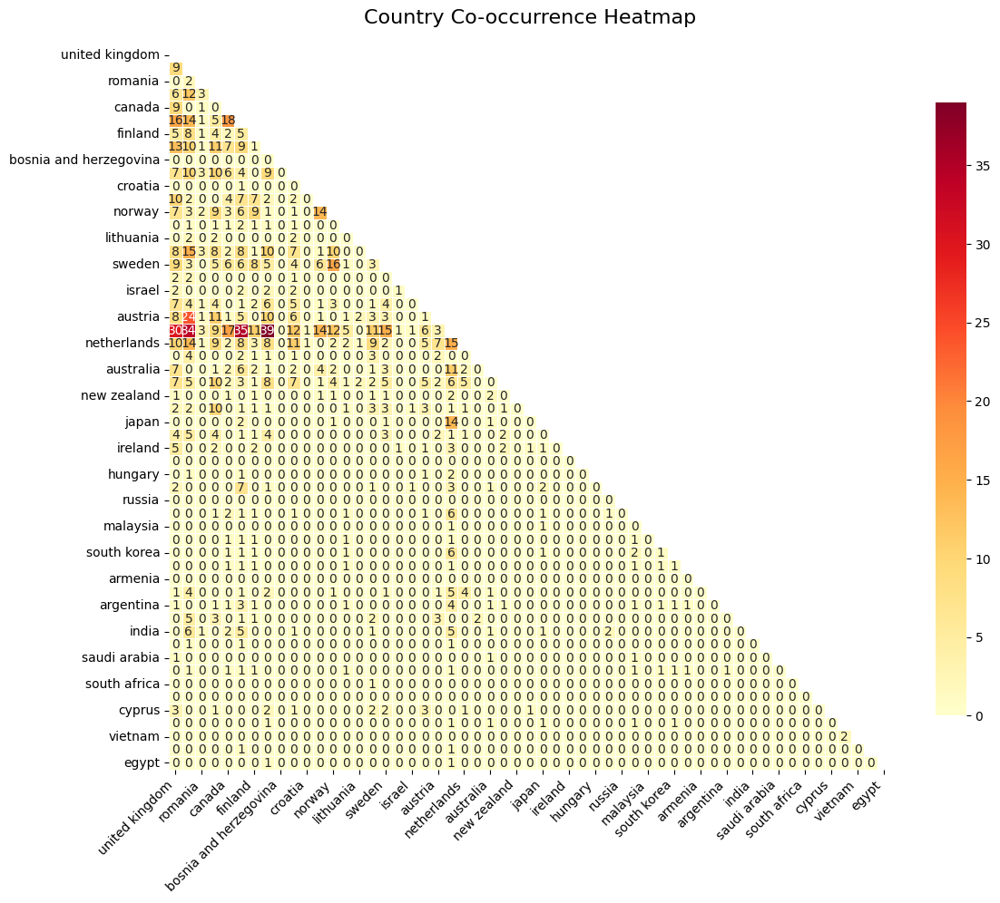

Country-Co-occurrence-Heatmap.png Saved.


In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming top_co_occurrence_matrix is already created

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create a mask to hide the upper triangle (optional, for symmetrical matrices)
mask = np.triu(np.ones_like(co_occurrence_matrix, dtype=bool))

# Create the heatmap
sns.heatmap(co_occurrence_matrix, 
            mask=mask,
            annot=True,  # Show the values in each cell
            cmap="YlOrRd",  # Color scheme (you can change this)
            fmt="d",  # Format of the annotations (d for integers)
            square=True,  # Make sure cells are square
            linewidths=.5,  # Width of the lines between cells
            cbar_kws={"shrink": .8},  # Adjust colorbar size
            )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Adjust the layout to prevent cutting off labels
plt.tight_layout()

# Set title
plt.title("Country Co-occurrence Heatmap", fontsize=16, pad=20)

# Optionally, save the figure
# plt.savefig('institution_co_occurrence_heatmap.png', dpi=300, bbox_inches='tight')
plt.savefig(OUTPUT_DIR  / "Country-Co-occurrence-Heatmap.png", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()
print("Country-Co-occurrence-Heatmap.png Saved.")

### Graph Visualization

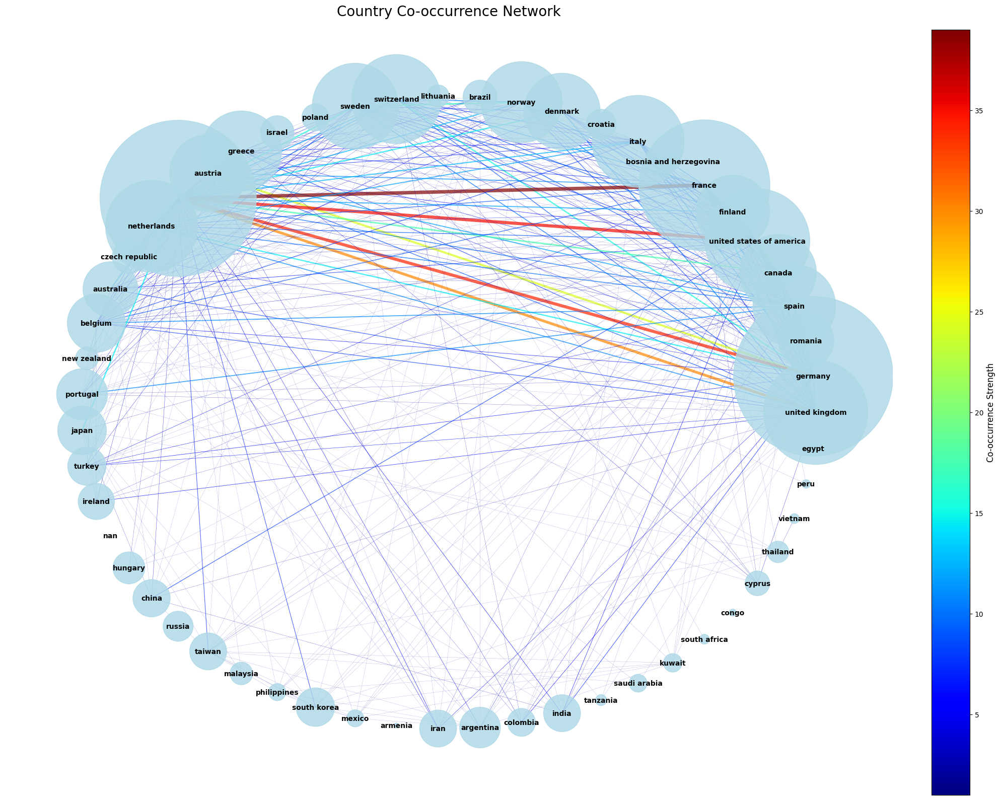

Country-Co-occurrence-Graph-With-NetworkX.png Saved.


In [10]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

## Use co_occurrence_matrix & G

# Calculate node sizes based on total co-occurrences
node_sizes = [sum(co_occurrence_matrix[node]) * 50 for node in G.nodes()]

# Calculate edge weights
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Normalize edge weights for width visualization
max_weight = max(edge_weights)
normalized_weights = [w / max_weight * 5 for w in edge_weights]  # Scale factor of 5

# Set up the plot
fig, ax = plt.subplots(figsize=(20, 16))

# Create a spring layout for node positions
# pos = nx.spring_layout(G, k=0.5, iterations=1)
pos = nx.circular_layout(G)

# Create a colormap for edge colors
edge_colors = plt.cm.jet(np.array(edge_weights) / max_weight)

# Draw the graph
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='lightblue', alpha=0.8, ax=ax)
nx.draw_networkx_edges(G, pos, width=normalized_weights, alpha=0.7, edge_color=edge_colors)
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap='jet', norm=plt.Normalize(vmin=min(edge_weights), vmax=max(edge_weights)))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
cbar.set_label('Co-occurrence Strength', fontsize=12)

# Set title and remove axes
ax.set_title('Country Co-occurrence Network', fontsize=20, pad=20)
ax.axis('off')

# Adjust layout and display
plt.tight_layout()
plt.savefig(OUTPUT_DIR  / "Country-Co-occurrence-Graph-With-NetworkX.png", dpi=300, bbox_inches='tight')
plt.show()
print("Country-Co-occurrence-Graph-With-NetworkX.png Saved.")


Export VOS Viewer

In [11]:
import random
import os

graph_data = {
"network": {
    "items": [{"id": node,
                "label": node,
                "x": round(random.uniform(-1.1515,0.200),4),
                "y": round(random.uniform(-1.1515,0.200),4)} for node, node_name in G.nodes(data="label")],
    "links": [{"source_id": source, "target_id": target, "strength": data["weight"]} for source, target, data in G.edges(data=True)]
}
}

# Convert the dictionary to JSON format and save it to a file
with open(os.path.join(OUTPUT_DIR ,"vos_viewer_country_co_occurrence.json"), 'w') as outfile:
    json.dump(graph_data, outfile, indent=4)

## Countries Co-occurrence - New Approch

### Create Co-occurrence matrix

In [13]:
from src.lib_co_occurrence import generate_co_occurrence_matrix, convert_co_occurrence_matrix2graph
co_occurrence_matrix = generate_co_occurrence_matrix(df,"affiliation_countries")

G = convert_co_occurrence_matrix2graph(co_occurrence_matrix,2)

### Graph Visualization

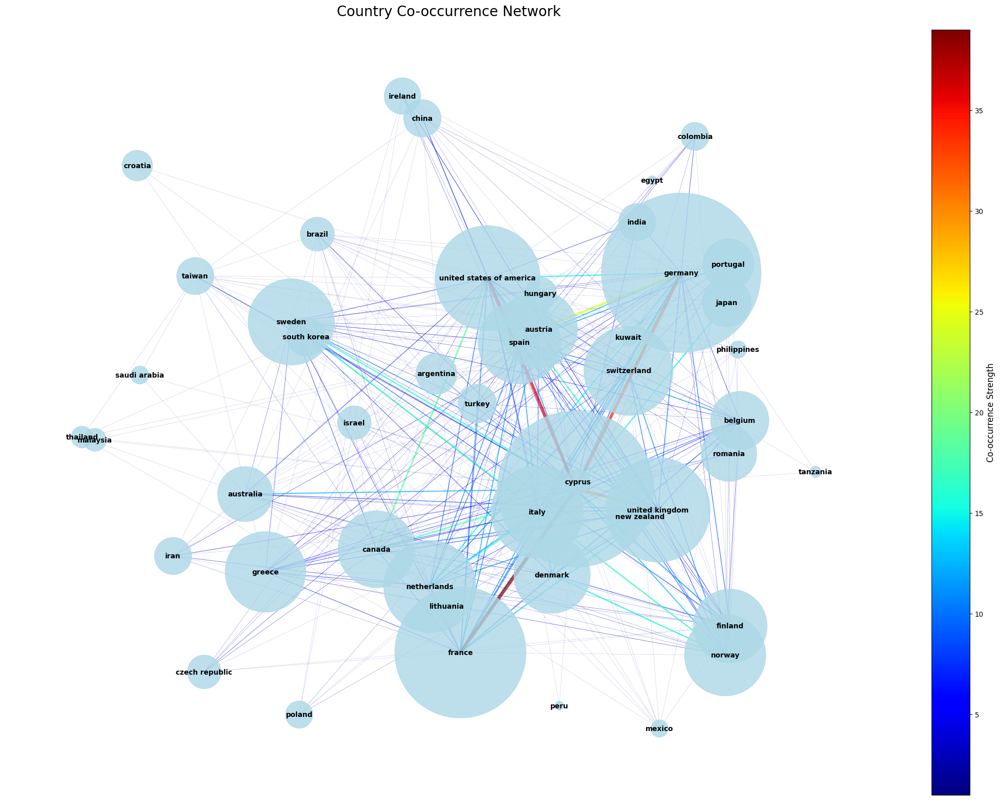

In [14]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

## Use co_occurrence_matrix & G

# Calculate node sizes based on total co-occurrences
node_sizes = [sum(co_occurrence_matrix[node]) * 50 for node in G.nodes()]

# Calculate edge weights
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Normalize edge weights for width visualization
max_weight = max(edge_weights)
normalized_weights = [w / max_weight * 5 for w in edge_weights]  # Scale factor of 5

# Set up the plot
fig, ax = plt.subplots(figsize=(20, 16))

# Create a spring layout for node positions
pos = nx.spring_layout(G, k=0.5, iterations=1)
# pos = nx.circular_layout(G)

# Create a colormap for edge colors
edge_colors = plt.cm.jet(np.array(edge_weights) / max_weight)

# Draw the graph
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='lightblue', alpha=0.8, ax=ax)
nx.draw_networkx_edges(G, pos, width=normalized_weights, alpha=0.7, edge_color=edge_colors)
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap='jet', norm=plt.Normalize(vmin=min(edge_weights), vmax=max(edge_weights)))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
cbar.set_label('Co-occurrence Strength', fontsize=12)

# Set title and remove axes
ax.set_title('Country Co-occurrence Network', fontsize=20, pad=20)
ax.axis('off')

# Adjust layout and display
plt.tight_layout()
plt.savefig(OUTPUT_DIR  / "Country-Co-occurrence-Graph-With-Edges-weight.png", dpi=300, bbox_inches='tight')
plt.show()


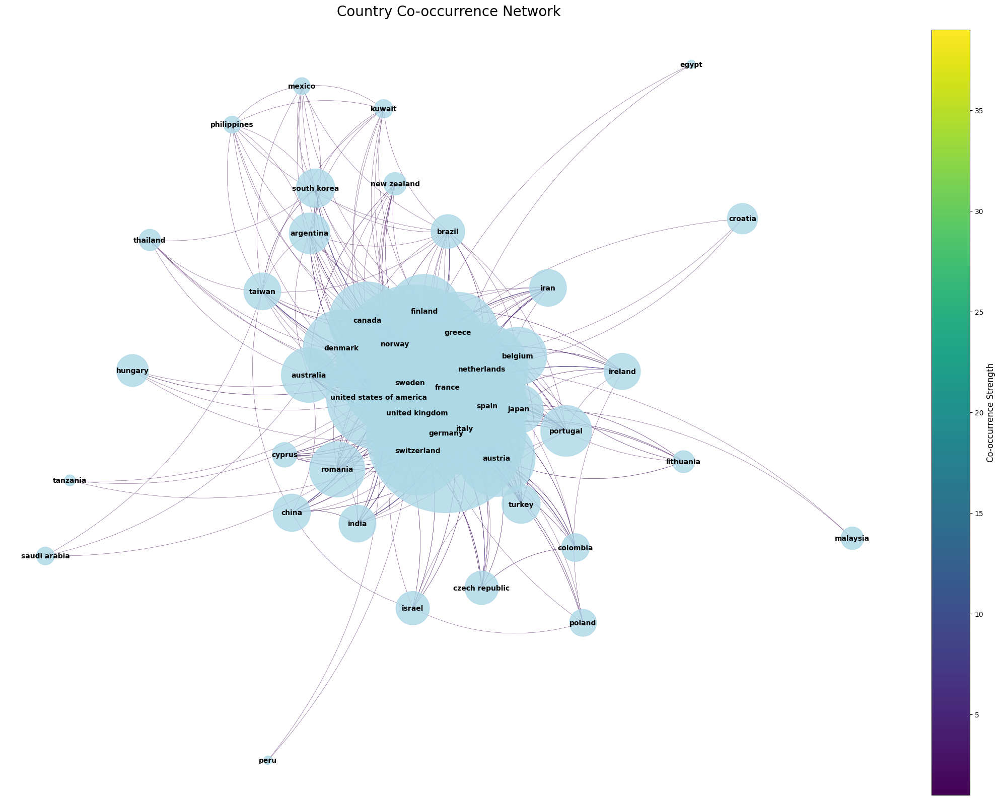

In [15]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import FancyArrowPatch
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# Function to draw curved edges using FancyArrowPatch
def draw_curved_edges(G, pos, edge_weights, ax, rad=0.2, edge_colors=None, linewidths=None):
    for (u, v), weight, color, lw in zip(G.edges(), edge_weights, edge_colors, linewidths):
        # Get positions of source and target nodes
        xy_start = pos[u]
        xy_end = pos[v]
        
        # Create a curved arrow using FancyArrowPatch
        arrow = FancyArrowPatch(
            xy_start,
            xy_end,
            connectionstyle=f"arc3,rad={rad}",  # Adjust curvature with rad
            color=color,
            linewidth=lw,
            alpha=0.7
        )
        ax.add_patch(arrow)

# Calculate node sizes based on total co-occurrences
node_sizes = [sum(co_occurrence_matrix[node]) * 50 for node in G.nodes()]

# Calculate edge weights
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Normalize edge weights for width visualization
max_weight = max(edge_weights)
normalized_weights = [w / max_weight * 5 for w in edge_weights]  # Scale factor of 5

# Set up the plot
fig, ax = plt.subplots(figsize=(20, 16))

# Create a spring layout for node positions
pos = nx.spring_layout(G, k=0.5, iterations=50)

# Create a colormap for edge colors
edge_colors = plt.cm.viridis(np.array(edge_weights) / max_weight)

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='lightblue', alpha=0.8, ax=ax)
# Draw curved edges
draw_curved_edges(
    G,
    pos,
    edge_weights=edge_weights,
    edge_colors=edge_colors,
    linewidths=normalized_weights,
    ax=ax,
    rad=-0.2  # Change this for more or less curvature
)
# Draw labels
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold', ax=ax)

# Create a colorbar
norm = Normalize(vmin=min(edge_weights), vmax=max(edge_weights))
sm = ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
cbar.set_label('Co-occurrence Strength', fontsize=12)

# Set title and remove axes
ax.set_title('Country Co-occurrence Network', fontsize=20, pad=20)
ax.axis('off')

# Adjust layout and display
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "Country-Co-occurrence-Graph-With-Curved-Edges.png", dpi=300, bbox_inches='tight')
plt.show()


### Heatmap Visualization

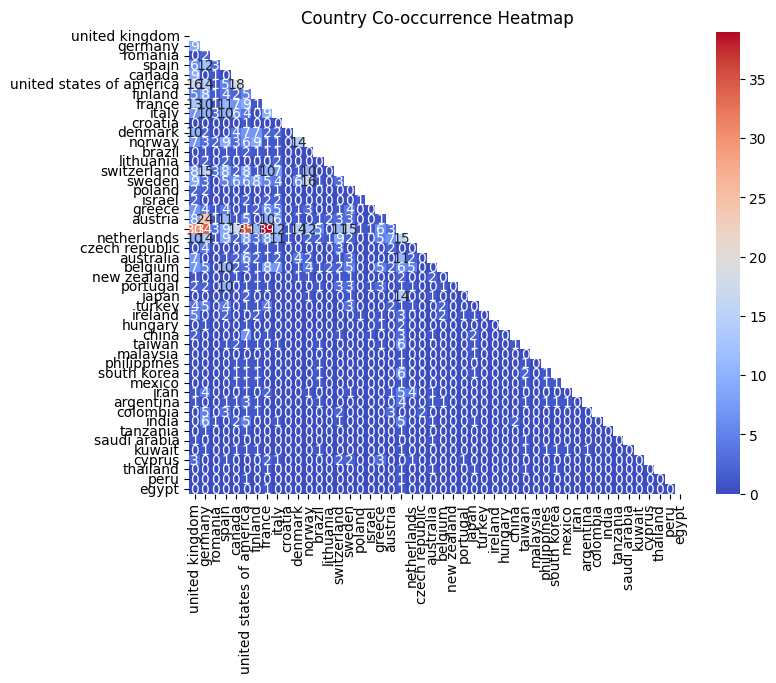

In [16]:
import networkx as nx
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## Use co_occurrence_matrix & G

# Step 2: Generate the adjacency matrix
adj_matrix = nx.to_numpy_array(G, weight='weight')

# Step 3: Create a mask for the upper triangle
mask = np.triu(np.ones_like(adj_matrix, dtype=bool))

# Step 4: Plot the heatmap with mask
plt.figure(figsize=(8, 6))
sns.heatmap(adj_matrix, mask=mask, annot=True, cmap='coolwarm', xticklabels=G.nodes(), yticklabels=G.nodes())
plt.title("Country Co-occurrence Heatmap")
# plt.xlabel("Country")
# plt.ylabel("Country")
plt.savefig(OUTPUT_DIR  / "Country-Co-occurrence-Heatmap.png", dpi=300, bbox_inches='tight')
plt.show()


### Export VOS Viewer

In [17]:
import random
import os

graph_data = {
"network": {
    "items": [{"id": node,
                "label": node,
                "x": round(random.uniform(-1.1515,0.200),4),
                "y": round(random.uniform(-1.1515,0.200),4)} for node, node_name in G.nodes(data="label")],
    "links": [{"source_id": source, "target_id": target, "strength": data["weight"]} for source, target, data in G.edges(data=True)]
}
}

# Convert the dictionary to JSON format and save it to a file
with open(os.path.join(OUTPUT_DIR ,"vos_viewer_country_co_occurrence.json"), 'w') as outfile:
    json.dump(graph_data, outfile, indent=4)

# Authors

## The Top 10 Authors in Research Impact

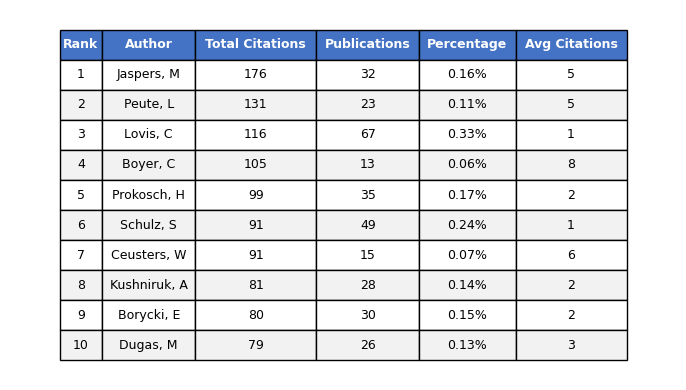

In [18]:
import matplotlib.pyplot as plt
import numpy as np

# Expand authors so each author gets their own row
authors_expanded = df.explode('authors')

# Group by authors and calculate the sum of citation_count and count of documents
author_stats = authors_expanded.groupby('authors').agg(
    citation_count=('citation_count', 'sum'),
    article_number=('authors', 'count')
).reset_index()

# Rename column name
author_stats = author_stats.rename(columns={
    'article_number': 'Publications',
    'citation_count': 'Total Citations'
})


# Calculate percentages and average citations
total_publications = author_stats['Publications'].sum()
author_stats['Percentage'] = (author_stats['Publications'] / total_publications * 100).round(2)
author_stats['Avg Citations'] = author_stats['Total Citations'] / author_stats['Publications']

# Sort the DataFrame by citation_count in descending order
author_stats_sorted = author_stats.sort_values(by='Total Citations', ascending=False)

# Save to CSV
author_stats_sorted.to_csv(OUTPUT_DIR / "The-Top-10-Authors-in-Research-Impact.csv")


# Get top 10 authors
top_10_authors = author_stats_sorted.head(10).copy()

# Create figure and axis
fig, ax = plt.subplots(figsize=(7, 4))

# Hide axes
ax.axis('off')

# Table data
table_data = [
    ['Rank', 'Author', 'Total Citations', 'Publications', 'Percentage', 'Avg Citations']
]

# Add data rows
for idx, row in top_10_authors.iterrows():
    table_data.append([
        str(len(table_data)),  # Rank
        row['authors'],
        str(int(row['Total Citations'])),
        str(int(row['Publications'])),
        f"{row['Percentage']}%",
        str(int(row['Avg Citations'])),
    ])

# Create table
table = ax.table(
    cellText=table_data,
    loc='center',
    cellLoc='center'
)

# Style the table

# Set font size
table.auto_set_font_size(False)
table.set_fontsize(9)

# Auto-adjust column widths
table.auto_set_column_width([0, 1, 2, 3, 4])

# Style header row
for j in range(len(table_data[0])):
    cell = table._cells[(0, j)]
    cell.set_facecolor('#4472C4')
    cell.set_text_props(color='white', weight='bold')

# Apply zebra striping to data rows
for i in range(1, len(table_data)):
    for j in range(len(table_data[0])):
        cell = table._cells[(i, j)]
        if i % 2 == 0:
            cell.set_facecolor('#F2F2F2')
        else:
            cell.set_facecolor('white')

# Scale table height
table.scale(1, 1.5)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.savefig(OUTPUT_DIR  / "The-Top-10-Authors-in-Research-Impact.png")
plt.show()

## Authors Co-occurrence

### Create Co-occurrence matrix

In [19]:
from src.lib_co_occurrence import generate_co_occurrence_matrix, convert_co_occurrence_matrix2graph

# Generate Co-occurrence Matrix
co_occurrence_matrix = generate_co_occurrence_matrix(df,"authors")

# # Save Matrix
# co_occurrence_matrix.to_csv(OUTPUT_DIR / "authors_co_occurrence_matrix.csv")
# print("authors_co_occurrence_matrix.csv Saved.")

# Convert Matrix to Graph
G = convert_co_occurrence_matrix2graph(co_occurrence_matrix,2)

print(G.number_of_nodes())

10788


### Graph Visualization

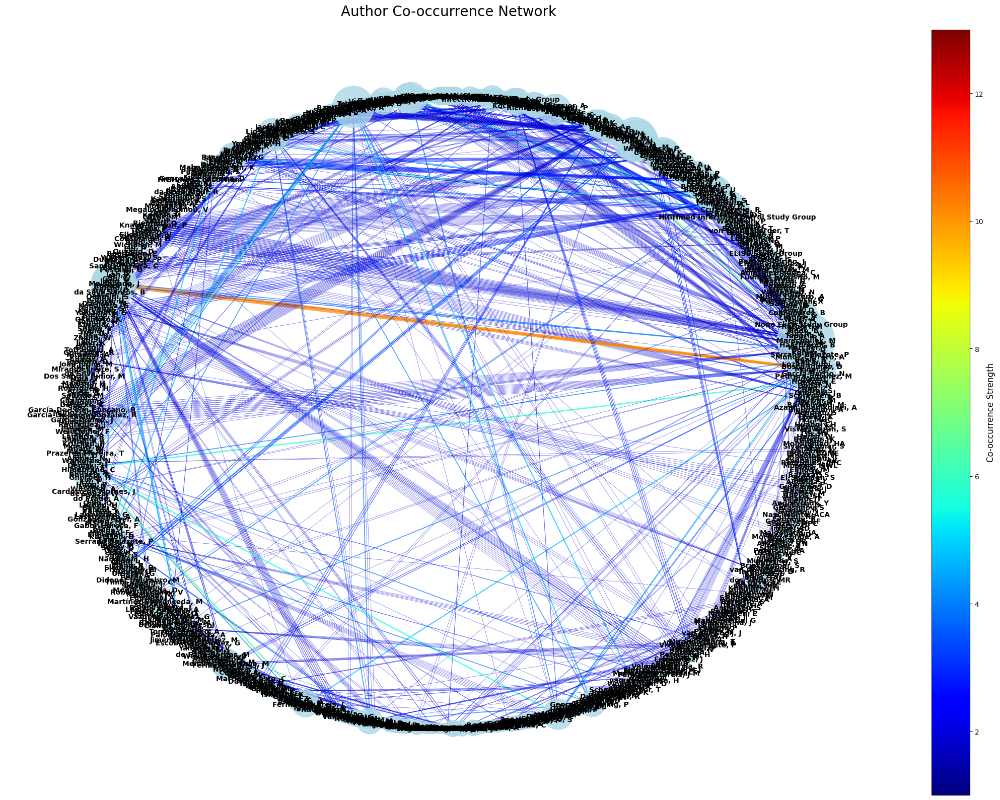

Author-Co-occurrence-Graph-With-NetworkX.png Saved.


In [7]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

## Use co_occurrence_matrix & G

# Calculate node sizes based on total co-occurrences
node_sizes = [sum(co_occurrence_matrix[node]) * 50 for node in G.nodes()]

# Calculate edge weights
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Normalize edge weights for width visualization
max_weight = max(edge_weights)
normalized_weights = [w / max_weight * 5 for w in edge_weights]  # Scale factor of 5

# Set up the plot
fig, ax = plt.subplots(figsize=(20, 16))

# Create a spring layout for node positions
# pos = nx.spring_layout(G, k=0.5, iterations=1)
pos = nx.circular_layout(G)

# Create a colormap for edge colors
edge_colors = plt.cm.jet(np.array(edge_weights) / max_weight)

# Draw the graph
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='lightblue', alpha=0.8, ax=ax)
nx.draw_networkx_edges(G, pos, width=normalized_weights, alpha=0.7, edge_color=edge_colors)
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap='jet', norm=plt.Normalize(vmin=min(edge_weights), vmax=max(edge_weights)))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
cbar.set_label('Co-occurrence Strength', fontsize=12)

# Set title and remove axes
ax.set_title('Author Co-occurrence Network', fontsize=20, pad=20)
ax.axis('off')

# Adjust layout and display
plt.tight_layout()
plt.savefig(OUTPUT_DIR  / "Author-Co-occurrence-Graph-With-NetworkX.png", dpi=300, bbox_inches='tight')
plt.show()
print("Author-Co-occurrence-Graph-With-NetworkX.png Saved.")


### Export VOS Viewer

In [8]:
import random
import os

graph_data = {
"network": {
    "items": [{"id": node,
                "label": node,
                "x": round(random.uniform(-1.1515,0.200),4),
                "y": round(random.uniform(-1.1515,0.200),4)} for node, node_name in G.nodes(data="label")],
    "links": [{"source_id": source, "target_id": target, "strength": data["weight"]} for source, target, data in G.edges(data=True)]
}
}

# Convert the dictionary to JSON format and save it to a file
with open(os.path.join(OUTPUT_DIR ,"vos_viewer_author_co_occurrence.json"), 'w') as outfile:
    json.dump(graph_data, outfile, indent=4)

print("os_viewer_author_co_occurrence.json Saved.")

os_viewer_author_co_occurrence.json Saved.


# Topic

## Topics Table

In [9]:
import pandas as pd

# Assuming 'df' is your original DataFrame
topic_df = df.explode('topics')

topic_df = topic_df.groupby('topics').agg({
    'citation_count': 'sum',
    'title': 'count',
    # 'authors': lambda x: len(set([author for sublist in x for author in sublist])),
    'affiliation_countries': lambda x: len(set([country for sublist in x for country in sublist])),
    'journal_issn': 'nunique'
}).reset_index()

topic_df.columns = ['Topic', 'Citations', 'Publications',
                    #  'Authors',
                       'Country', 'Journals']


# Save to CSV
topic_df.to_csv(OUTPUT_DIR / "topic_df.csv")



### change & modification

In [ ]:
import pandas as pd
import ast

def safe_eval_list(s):
    if isinstance(s, list):
        return s
    try:
        return ast.literal_eval(s)
    except (ValueError, SyntaxError):
        return s.strip('[]').replace("'", "").split(', ')

# Read the CSV file
topic_df = pd.read_csv(r'C:\Users\BT\Desktop\New folder\topic_df_inprocess.csv')

# Convert 'topics' from string to list
df['topics'] = df['topics'].apply(safe_eval_list)

# Function to replace topics with main_topic if found in CSV
def replace_topics(topics):
    return [topic_df.loc[topic_df['Topic'] == topic, 'main_topic'].values[0] 
            if topic in topic_df['Topic'].values and not pd.isna(topic_df.loc[topic_df['Topic'] == topic, 'main_topic'].values[0])
            else topic 
            for topic in topics]

# Apply the function to replace topics
df['topics'] = df['topics'].apply(replace_topics)

# Explode the topics column to create separate rows for each topic
df_exploded = df.explode('topics')

# Create the new DataFrame with the specified columns
new_df = df_exploded.groupby('topics').agg({
    'citation_count': 'sum',
    'title': 'count',
    'authors': lambda x: len(set(author for authors in x for author in safe_eval_list(authors))),
    'affiliation_integration_country': lambda x: len(set(country for countries in x for country in safe_eval_list(countries))),
    'journal_issn': lambda x: len(set(x))
}).rename(columns={
    'topics': 'Topic',
    'citation_count': 'Citations',
    'title': 'Publications',
    'authors': 'Authors',
    'affiliation_integration_country': 'Country',
    'journal_issn': 'Journals'
}).reset_index()


new_df.to_csv(OUTPUT_DIR / "new_topic_df.csv")


## Topics Co-occurrence

### Create Co-occurrence matrix

In [10]:
from src.lib_co_occurrence import generate_co_occurrence_matrix, convert_co_occurrence_matrix2graph
co_occurrence_matrix = generate_co_occurrence_matrix(df,"topics")

G = convert_co_occurrence_matrix2graph(co_occurrence_matrix,1)

print(G.number_of_nodes())

31657


### Heatmap Visualization 1

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming top_co_occurrence_matrix is already created

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create a mask to hide the upper triangle (optional, for symmetrical matrices)
# mask = np.triu(np.ones_like(top_co_occurrence_matrix, dtype=bool))
mask = np.triu(np.ones_like(co_occurrence_matrix, dtype=bool))
# Create the heatmap
sns.heatmap(co_occurrence_matrix, #top_co_occurrence_matrix, 
            mask=mask,
            annot=True,  # Show the values in each cell
            cmap="YlOrRd",  # Color scheme (you can change this)
            fmt="d",  # Format of the annotations (d for integers)
            square=True,  # Make sure cells are square
            linewidths=.5,  # Width of the lines between cells
            cbar_kws={"shrink": .8},  # Adjust colorbar size
            )

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Adjust the layout to prevent cutting off labels
plt.tight_layout()

# Set title
plt.title("Topic Co-occurrence Heatmap", fontsize=16, pad=20)

# Optionally, save the figure
# plt.savefig('institution_co_occurrence_heatmap.png', dpi=300, bbox_inches='tight')
plt.savefig(OUTPUT_DIR  / "Topic-Co-occurrence-Heatmap.png", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

### Graph Visualization

### colormap 

In [ ]:
from matplotlib import colormaps
list(colormaps)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

cmaps = [('Perceptually Uniform Sequential', [
            'viridis', 'plasma', 'inferno', 'magma', 'cividis']),
         ('Sequential', [
            'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',
            'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',
            'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn']),
         ('Sequential (2)', [
            'binary', 'gist_yarg', 'gist_gray', 'gray', 'bone', 'pink',
            'spring', 'summer', 'autumn', 'winter', 'cool', 'Wistia',
            'hot', 'afmhot', 'gist_heat', 'copper']),
         ('Diverging', [
            'PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu',
            'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic']),
         ('Cyclic', ['twilight', 'twilight_shifted', 'hsv']),
         ('Qualitative', [
            'Pastel1', 'Pastel2', 'Paired', 'Accent',
            'Dark2', 'Set1', 'Set2', 'Set3',
            'tab10', 'tab20', 'tab20b', 'tab20c']),
         ('Miscellaneous', [
            'flag', 'prism', 'ocean', 'gist_earth', 'terrain', 'gist_stern',
            'gnuplot', 'gnuplot2', 'CMRmap', 'cubehelix', 'brg',
            'gist_rainbow', 'rainbow', 'jet', 'turbo', 'nipy_spectral',
            'gist_ncar'])]

gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))


def plot_color_gradients(cmap_category, cmap_list):
    # Create figure and adjust figure height to number of colormaps
    nrows = len(cmap_list)
    figh = 0.35 + 0.15 + (nrows + (nrows-1)*0.1)*0.22
    fig, axs = plt.subplots(nrows=nrows, figsize=(6.4, figh))
    fig.subplots_adjust(top=1-.35/figh, bottom=.15/figh, left=0.2, right=0.99)

    axs[0].set_title(f"{cmap_category} colormaps", fontsize=14)

    for ax, cmap_name in zip(axs, cmap_list):
        ax.imshow(gradient, aspect='auto', cmap=cmap_name)
        ax.text(-.01, .5, cmap_name, va='center', ha='right', fontsize=10,
                transform=ax.transAxes)

    # Turn off *all* ticks & spines, not just the ones with colormaps.
    for ax in axs:
        ax.set_axis_off()


for cmap_category, cmap_list in cmaps:
    plot_color_gradients(cmap_category, cmap_list)

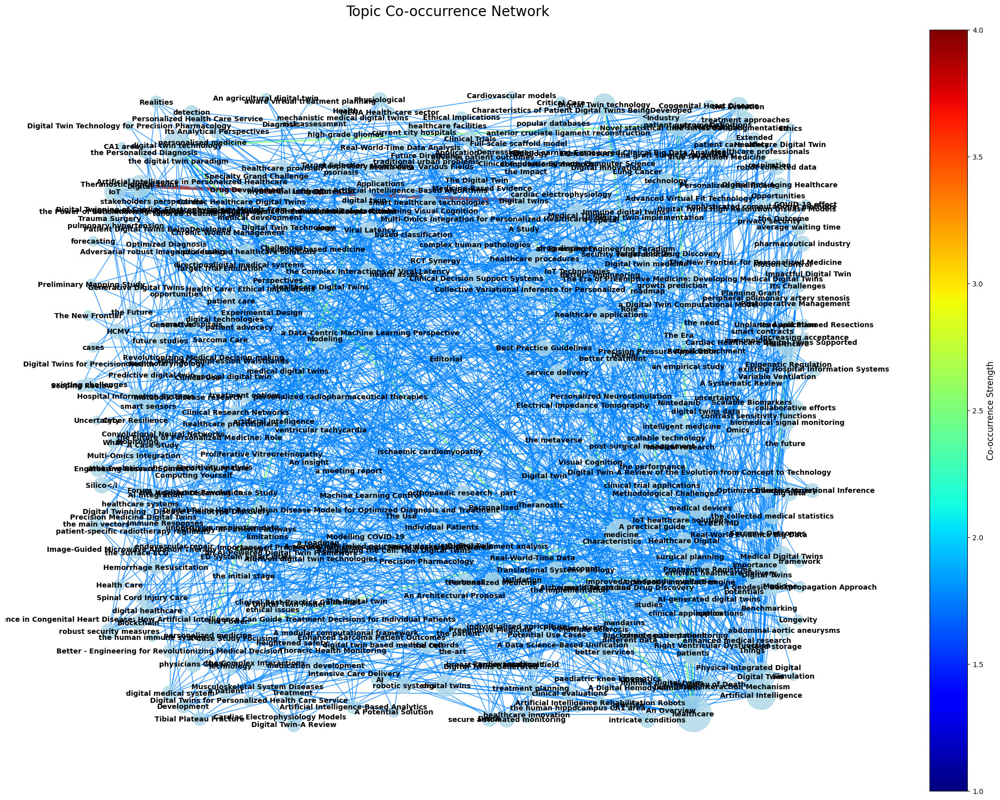

Topic-Co-occurrence-Graph-With-NetworkX.png Saved.


In [53]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

## Use co_occurrence_matrix & G

# Calculate node sizes based on total co-occurrences
node_sizes = [sum(co_occurrence_matrix[node]) * 50 for node in G.nodes()]

# Calculate edge weights
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Normalize edge weights for width visualization
max_weight = max(edge_weights)
normalized_weights = [w / max_weight * 5 for w in edge_weights]  # Scale factor of 5

# Set up the plot
fig, ax = plt.subplots(figsize=(20, 16))

# Create a spring layout for node positions
pos = nx.spring_layout(G, k=0.5, iterations=2)
# pos = nx.circular_layout(G)

# Create a colormap for edge colors
edge_colors = plt.cm.jet(np.array(edge_weights) / max_weight)

# Draw the graph
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='lightblue', alpha=0.8, ax=ax)
nx.draw_networkx_edges(G, pos, width=normalized_weights, alpha=0.7, edge_color=edge_colors)
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap='jet', norm=plt.Normalize(vmin=min(edge_weights), vmax=max(edge_weights)))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
cbar.set_label('Co-occurrence Strength', fontsize=12)

# Set title and remove axes
ax.set_title('Topic Co-occurrence Network', fontsize=20, pad=20)
ax.axis('off')

# Adjust layout and display
plt.tight_layout()
plt.savefig(OUTPUT_DIR  / "Topic-Co-occurrence-Graph-With-NetworkX.png", dpi=300, bbox_inches='tight')
plt.show()
print("Topic-Co-occurrence-Graph-With-NetworkX.png Saved.")



### Export VOS Viewer

In [54]:
import random
import os

graph_data = {
"network": {
    "items": [{"id": node,
                "label": node,
                "x": round(random.uniform(-1.1515,0.200),4),
                "y": round(random.uniform(-1.1515,0.200),4)} for node, node_name in G.nodes(data="label")],
    "links": [{"source_id": source, "target_id": target, "strength": data["weight"]} for source, target, data in G.edges(data=True)]
}
}

# Convert the dictionary to JSON format and save it to a file
with open(os.path.join(OUTPUT_DIR ,"vos_viewer_topic_co_occurrence.json"), 'w') as outfile:
    json.dump(graph_data, outfile, indent=4)

print("os_viewer_topic_co_occurrence.json Saved.")

os_viewer_topic_co_occurrence.json Saved.


## Research Gap

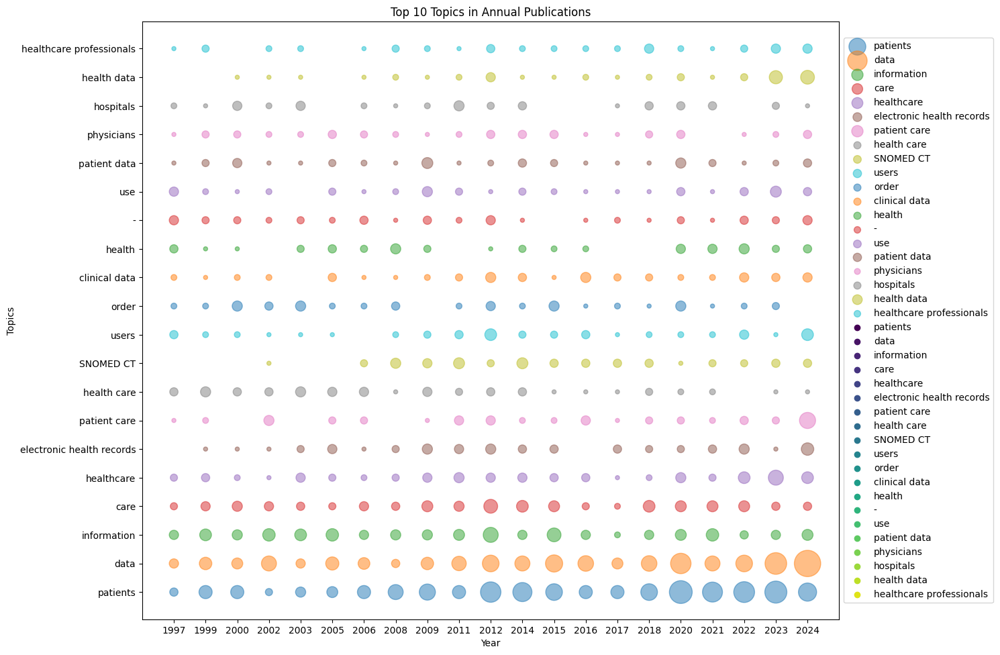

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming df is your dataframe
# Get the top 10 topics
top_10_topics = df['topics'].explode().value_counts().nlargest(20).index.tolist()

# Filter the dataframe for top 10 topics and group by year and topic
topic_counts = df[df['topics'].apply(lambda x: any(topic in x for topic in top_10_topics))]
topic_counts = topic_counts.explode('topics')
topic_counts = topic_counts[topic_counts['topics'].isin(top_10_topics)]
topic_counts = topic_counts.groupby(['year', 'topics']).size().unstack(fill_value=0)

# Create the bubble chart
fig, ax = plt.subplots(figsize=(15, 10))

years = topic_counts.index
topics = top_10_topics

for i, topic in enumerate(topics):
    sizes = topic_counts[topic] * 20  # Adjust the multiplier to change bubble size
    ax.scatter(years, [i] * len(years), s=sizes, alpha=0.5, label=topic)

ax.set_xlabel('Year')
ax.set_yticks(range(len(topics)))
ax.set_yticklabels(topics)
ax.set_ylabel('Topics')
ax.set_title('Top 10 Topics in Annual Publications')

# Add a color legend
for i, topic in enumerate(topics):
    ax.scatter([], [], c=[plt.cm.viridis(i/len(topics))], label=topic)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()


## Similarity

In [12]:
import pandas as pd
import networkx as nx
from collections import Counter

# Assuming df is already loaded with your JSON data
all_topics = [topic for topics in df['topics'] for topic in topics]
unique_topics = list(set(all_topics))
topic_counts = Counter(all_topics)
G = nx.Graph()

for topics in df['topics']:
    for i in range(len(topics)):
        for j in range(i+1, len(topics)):
            G.add_edge(topics[i], topics[j])

degree_centrality = nx.degree_centrality(G)
result_df = pd.DataFrame({
    'topic': unique_topics,
    'number_of_articles': [topic_counts[topic] for topic in unique_topics],
    'degree_centrality': [degree_centrality.get(topic, 0) for topic in unique_topics]
})

# Sort by number of articles in descending order
result_df = result_df.sort_values('number_of_articles', ascending=False).reset_index(drop=True)

# Sort by number of articles in descending order
result_df = result_df.sort_values('number_of_articles', ascending=False).reset_index(drop=True)

print(len(result_df))
result_df.head()
result_df.to_csv(OUTPUT_DIR / "topic_similarity_list.csv")


2459


### Cluster 1

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create a list of all topics as strings
topic_strings = [' '.join(topics) for topics in df['topics']]

# Vectorize the topics
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(topic_strings)


from sklearn.cluster import KMeans

# Define the number of clusters
num_clusters = 15  # You can adjust this number based on your needs

# Perform K-Means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X)

import numpy as np

# Add the cluster labels to the DataFrame
df['cluster'] = clusters

# Determine the cluster name based on the topic with the most articles in each cluster
cluster_names = {}
for cluster_id in range(num_clusters):
    # Filter articles in the current cluster
    cluster_articles = df[df['cluster'] == cluster_id]
    
    # Count occurrences of each topic in the cluster
    topic_counts_in_cluster = Counter([topic for topics in cluster_articles['topics'] for topic in topics])
    
    # Find the topic with the most articles
    most_common_topic = max(topic_counts_in_cluster, key=topic_counts_in_cluster.get)
    
    # Assign this topic as the cluster name
    cluster_names[cluster_id] = most_common_topic

# Map cluster IDs to names
df['cluster_name'] = df['cluster'].map(cluster_names)

print(df[['topics', 'cluster', 'cluster_name']])


                                                topics  cluster  \
0    [Iranian National EHR, EHR, basic insurance or...        9   
1    [research purposes, HL7 FHIR, artificial intel...        7   
2    [multiple language variants, additional langua...        1   
3    [health, clinical systems, standard terminolog...        7   
4    [different health data standards, further data...        8   
..                                                 ...      ...   
320  [efficient care, advanced architecture standar...        6   
321  [health information, important health informat...        7   
322  [January, clinical IR research, clinical IR, c...        7   
323  [main path analysis, citation relevance, resea...        7   
324  [EHR data, disease prediction, large EHRs, cli...        8   

                  cluster_name  
0    electronic health records  
1    semantic interoperability  
2                     EHR data  
3    semantic interoperability  
4                         data

### 

In [15]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd



# Vectorize the topics
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(result_df['topic'])

# Calculate cosine similarity matrix
similarity_matrix = cosine_similarity(tfidf_matrix)


In [16]:
def find_most_similar_topic(index, similarity_matrix, df):
    # Get similarities for the current topic
    similarities = similarity_matrix[index]
    
    # Exclude self-similarity by setting its value to zero
    similarities[index] = 0
    
    # Find the index of the most similar topic with the highest article count
    most_similar_index = similarities.argmax()
    
    return df.iloc[most_similar_index]['topic']

# Create new column for most similar topic
result_df['most_similar_topic'] = [
    find_most_similar_topic(i, similarity_matrix, result_df) for i in range(len(result_df))
]

print(result_df)


                                        topic  number_of_articles  \
0                                  archetypes                  51   
1                   semantic interoperability                  27   
2                                        data                  26   
3                                     openEHR                  26   
4                   electronic health records                  20   
...                                       ...                 ...   
2454  legacy Electronic Health Record Systems                   1   
2455             suitable measurement methods                   1   
2456                       kernel application                   1   
2457                   core clinical concepts                   1   
2458                         mapping concepts                   1   

      degree_centrality                       most_similar_topic  
0              0.155411                               Archetypes  
1              0.084622              

In [18]:
# Group by most similar topic and sum number of articles
grouped_df = result_df.groupby('most_similar_topic', as_index=False).agg({'number_of_articles': 'sum'})
# Sort by number of articles in descending order
grouped_df = grouped_df.sort_values('number_of_articles', ascending=False).reset_index(drop=True)
print(grouped_df)

                 most_similar_topic  number_of_articles
0                        archetypes                 155
1                        Archetypes                  51
2                              data                  27
3         Semantic interoperability                  27
4                              Data                  26
...                             ...                 ...
1330             clinical resources                   1
1331    clinical routine data usage                   1
1332  clinical routine imaging data                   1
1333                 clinical staff                   1
1334                     data reuse                   1

[1335 rows x 2 columns]


### GPT

In [29]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx


# Step 1: Load JSON data into DataFrame
df = pd.DataFrame(data)

# Step 2: Create a result DataFrame with topic counts and degree centrality
all_topics = df['topics'].explode().reset_index(drop=True)
topic_counts = all_topics.value_counts().reset_index()
topic_counts.columns = ['topic', 'number_of_articles']

# Create a co-occurrence graph
co_occurrence = nx.Graph()
for topics in df['topics']:
    if topics:
        co_occurrence.add_edges_from([(a, b) for a in topics for b in topics if a != b])

# Calculate degree centrality
degree_centrality = nx.degree_centrality(co_occurrence)
topic_counts['degree_centrality'] = topic_counts['topic'].map(degree_centrality)

result_df = topic_counts

# Step 3: Use TF-IDF vectorization to calculate similarity
tfidf = TfidfVectorizer()
tfidf_matrix = tfidf.fit_transform(result_df['topic'])
similarity_matrix = cosine_similarity(tfidf_matrix)

# Step 4: Identify most similar topics
most_similar_topic = []
for idx, row in enumerate(similarity_matrix):
    similar_indices = [(i, sim) for i, sim in enumerate(row) if i != idx]
    most_similar = max(similar_indices, key=lambda x: x[1], default=(None, None))
    most_similar_topic.append(result_df.iloc[most_similar[0]]['topic'] if most_similar[0] is not None else None)

result_df['most_similar_topic'] = most_similar_topic

print(result_df)
result_df.to_csv(OUTPUT_DIR / "topic_similarity_list1.csv")
# Step 5: Group by most similar topic and sum articles
grouped_df = result_df.groupby('most_similar_topic', dropna=True)['number_of_articles'].sum().reset_index()
# grouped_df.columns = ['most_similar_topic', 'total_article_count']

# Step 6: Output the final grouped DataFrame
print(grouped_df)


                          topic  number_of_articles  degree_centrality  \
0                    archetypes                  51           0.155411   
1     semantic interoperability                  27           0.084622   
2                          data                  26           0.088283   
3                       openEHR                  26           0.089910   
4     electronic health records                  20           0.067941   
...                         ...                 ...                ...   
2454            genetic summary                   1           0.003662   
2455            gene expression                   1           0.003662   
2456      Ocean Template Design                   1           0.003662   
2457          nutrigenomic data                   1           0.003662   
2458        predictive modeling                   1           0.003662   

             most_similar_topic  
0                    Archetypes  
1     Semantic interoperability  
2        

In [34]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx


field = "keywords"

# Step 1: Load JSON data into DataFrame
df = pd.DataFrame(data)

# Convert topics to lowercase
df[field] = df[field].apply(lambda x: [t.lower() for t in x] if isinstance(x, list) else x)

# Step 2: Create a result DataFrame with topic counts and degree centrality
all_topics = df[field].explode().reset_index(drop=True)
topic_counts = all_topics.value_counts().reset_index()
topic_counts.columns = [field, 'number_of_articles']

# Create a co-occurrence graph
co_occurrence = nx.Graph()
for topics in df[field]:
    if topics:
        co_occurrence.add_edges_from([(a, b) for a in topics for b in topics if a != b])

# Calculate degree centrality
degree_centrality = nx.degree_centrality(co_occurrence)
topic_counts['degree_centrality'] = topic_counts[field].map(degree_centrality)

result_df = topic_counts

# Step 3: Use TF-IDF vectorization to calculate similarity
tfidf = TfidfVectorizer()
tfidf_matrix = tfidf.fit_transform(result_df[field])
similarity_matrix = cosine_similarity(tfidf_matrix)

# Step 4: Identify most similar topics
most_similar_topic = []
for idx, row in enumerate(similarity_matrix):
    similar_indices = [(i, sim) for i, sim in enumerate(row) if i != idx]
    most_similar = max(similar_indices, key=lambda x: x[1], default=(None, None))
    most_similar_topic.append(result_df.iloc[most_similar[0]][field] if most_similar[0] is not None else None)

result_df[f'most_similar_{field}'] = most_similar_topic

# Step 5: Group by most similar topic and sum articles
grouped_df = result_df.groupby(f'most_similar_{field}', dropna=True)['number_of_articles'].sum().reset_index()
grouped_df.columns = [f'most_similar_{field}', 'total_article_count']
grouped_df = grouped_df.sort_values('total_article_count', ascending=False).reset_index(drop=True)
# Step 6: Output the final grouped DataFrame
print(grouped_df)


                     most_similar_keywords  total_article_count
0                electronic health records                  650
1    electronic health records and systems                  220
2                        openehr archetype                   91
3                   medical record systems                   67
4                          medical records                   66
..                                     ...                  ...
409                                hl7 cda                    1
410       hl7 virtual medical record (vmr)                    1
411                   human growth hormone                    1
412                               ideology                    1
413                                    xml                    1

[414 rows x 2 columns]


# Keyword

## Keyword Co-occurrence

### Create Co-occurrence matrix

In [12]:
from src.lib_co_occurrence import generate_co_occurrence_matrix, convert_co_occurrence_matrix2graph

# Generate Co-occurrence Matrix
co_occurrence_matrix = generate_co_occurrence_matrix(df,"keywords")

# # Save Matrix
# co_occurrence_matrix.to_csv(OUTPUT_DIR / "keywords_co_occurrence_matrix.csv")
# print("keywords_co_occurrence_matrix.csv Saved.")

# Convert Matrix to Graph
G = convert_co_occurrence_matrix2graph(co_occurrence_matrix,3)

print(G.number_of_nodes())

7542


### Graph Visualization

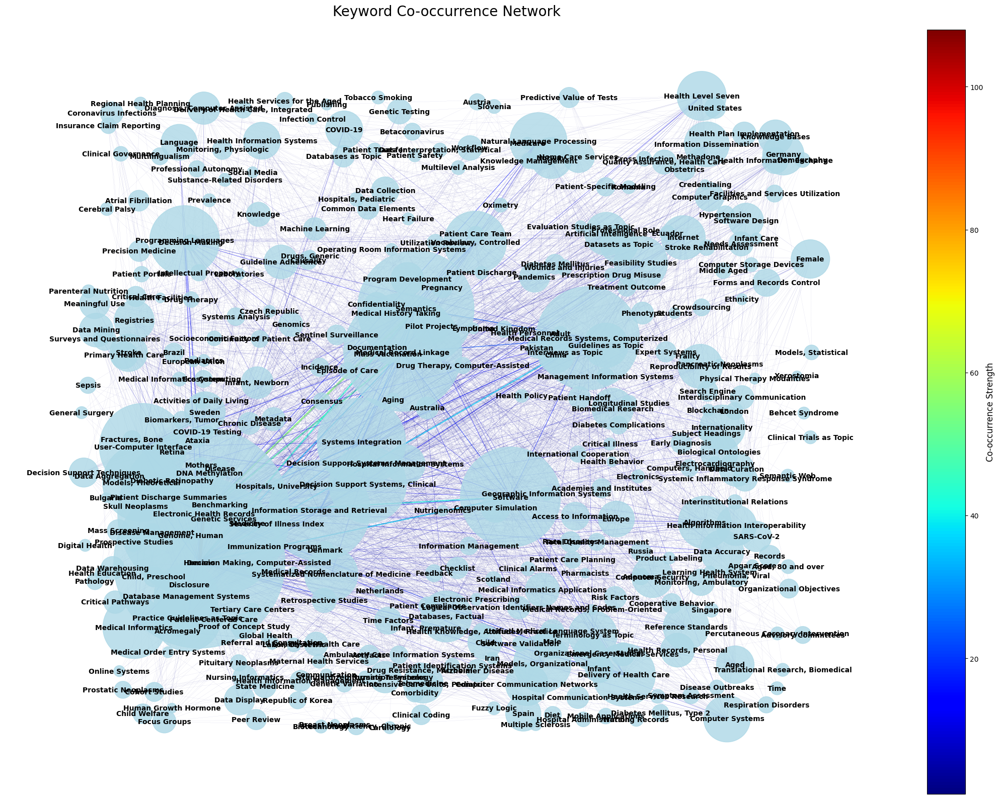

Keyword-Co-occurrence-Graph-With-NetworkX.png Saved


In [18]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

## Use co_occurrence_matrix & G

# Calculate node sizes based on total co-occurrences
node_sizes = [sum(co_occurrence_matrix[node]) * 50 for node in G.nodes()]

# Calculate edge weights
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Normalize edge weights for width visualization
max_weight = max(edge_weights)
normalized_weights = [w / max_weight * 5 for w in edge_weights]  # Scale factor of 5

# Set up the plot
fig, ax = plt.subplots(figsize=(20, 16))

# Create a spring layout for node positions
pos = nx.spring_layout(G, k=0.5, iterations=1)
# pos = nx.circular_layout(G)

# Create a colormap for edge colors
edge_colors = plt.cm.jet(np.array(edge_weights) / max_weight)

# Draw the graph
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='lightblue', alpha=0.8, ax=ax)
nx.draw_networkx_edges(G, pos, width=normalized_weights, alpha=0.7, edge_color=edge_colors)
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap='jet', norm=plt.Normalize(vmin=min(edge_weights), vmax=max(edge_weights)))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
cbar.set_label('Co-occurrence Strength', fontsize=12)

# Set title and remove axes
ax.set_title('Keyword Co-occurrence Network', fontsize=20, pad=20)
ax.axis('off')

# Adjust layout and display
plt.tight_layout()
plt.savefig(OUTPUT_DIR  / "Keyword-Co-occurrence-Graph-With-NetworkX.png", dpi=300, bbox_inches='tight')
plt.show()
print("Keyword-Co-occurrence-Graph-With-NetworkX.png Saved")

### Export VOS Viewer

In [19]:
import random
import os

graph_data = {
"network": {
    "items": [{"id": node,
                "label": node,
                "x": round(random.uniform(-1.1515,0.200),4),
                "y": round(random.uniform(-1.1515,0.200),4)} for node, node_name in G.nodes(data="label")],
    "links": [{"source_id": source, "target_id": target, "strength": data["weight"]} for source, target, data in G.edges(data=True)]
}
}

# Convert the dictionary to JSON format and save it to a file
with open(os.path.join(OUTPUT_DIR ,"vos_viewer_keyword_co_occurrence.json"), 'w') as outfile:
    json.dump(graph_data, outfile, indent=4)

print("Save vos_viewer_keyword_co_occurrence.json.")

Save vos_viewer_keyword_co_occurrence.json.
